In [4]:

import os

import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

from PIL import Image

import tensorflow as tf


2021-10-18 16:57:28.638473: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-10-18 16:57:28.638495: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [5]:
this_folder = os.path.abspath("")
DATA_FOLDER = os.path.join(this_folder, "data")
MODELS_FOLDER = os.path.join(this_folder, "models")

In [6]:
def load_image(filename):
    image = Image.open(os.path.join(DATA_FOLDER, filename))
    return image

In [7]:
def predict_image(image, model):
    image = image.resize((224,224))
    image = np.array(image)
    image = tf.reshape(image, (1,224,224,3))
    pred = model.predict(image)
    return np.argmax(pred), np.max(pred)


In [39]:
def display_slice_and_predictions(coupe, predicted_locations):
    linewidth=3
    color=[0, 0, 1]
    label_to_text = {
        0: "Negative",
        1: "Primordial", 
        2: "Primary", 
        3: "Secondary", 
        4: "Tertiary", 
    }
    plt.figure(figsize=(20, 20))
    plt.axis("off")
    plt.imshow(coupe)
    ax = plt.gca()
    for prediction in predicted_locations:
        box = prediction["bbox"]
        label = prediction["label"]
        label_text = label_to_text[label]
        proba = prediction["proba"]

        text = "{}: {:.2f}".format(label, proba)
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            x1,
            y1,
            text,
            bbox={"facecolor": color, "alpha": 1},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()

In [9]:
def generate_grid_for_image(image, box_width_pixels=800):
    """generator of square boxes that create a grid overlay for the given image"""
    width = box_width_pixels
    stride = width // 2

    x1 = 0
    y1 = 0
    while True:
        while True:
            bbox = (x1, y1, x1 + width, y1 + width)
            yield bbox

            x1 = x1 + stride
            if x1 + width > image.width:
                break
        x1 = 0
        y1 += stride

        if y1 + width > image.height:
            break



In [10]:
IMAGE_TO_ANALYSE = 'D-1M01-3.jpg'
MODEL_PATH = os.path.join(MODELS_FOLDER, "classifier")
WIDTH_OF_GRID_PIXELS = 200
PROBA_THRESHOLD = 0.0

In [11]:
coupe = load_image(IMAGE_TO_ANALYSE)

In [12]:
model_loaded = tf.keras.models.load_model(MODEL_PATH)
model_loaded

2021-10-18 16:57:30.258297: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-10-18 16:57:30.258323: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2021-10-18 16:57:30.258346: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (frcaud-Latitude-7420): /proc/driver/nvidia/version does not exist
2021-10-18 16:57:30.258543: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2021-10-18 16:57:36.658133: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-10-18 16:57:36.677878: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 1804800000 Hz


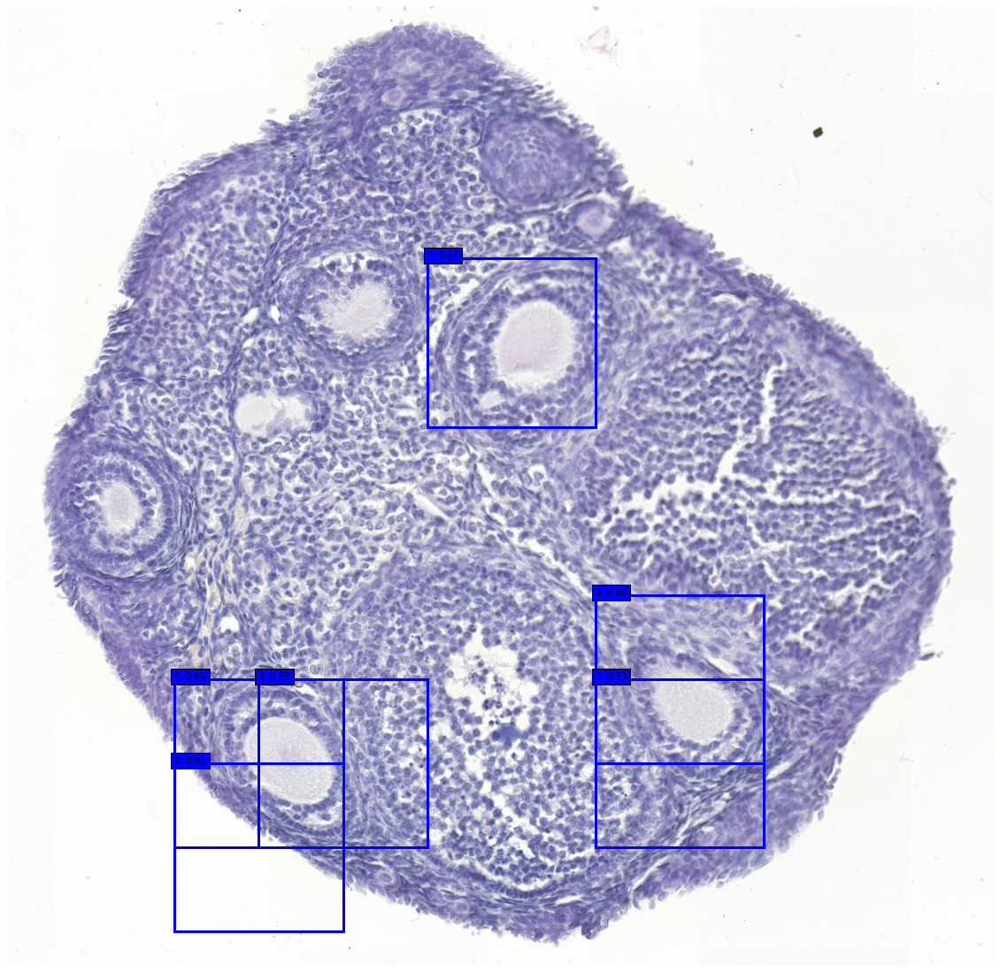

In [13]:

def predict_locations_for_gridsize(coupe, box_width_pixels, model):
    boxes = generate_grid_for_image(coupe, box_width_pixels=box_width_pixels)
    predicted_locations = []
    for box in boxes:
        cropped_image = coupe.crop(box)
        label, proba = predict_image(cropped_image, model)
        predicted_locations.append({
                "bbox": box,
                "label": label,
                "proba": proba
            })
    return predicted_locations

def filter_predictions(predicted_locations, proba_threshold=0.6):
    def should_keep_prediction(label, proba):
        if label == 0:
            return False
        if proba < proba_threshold:
            return False
        return True

    selected_locations = [
        prediction
        for prediction in predicted_locations
        if should_keep_prediction(prediction["label"], prediction["proba"])
    ]

    return selected_locations
        
#

predicted_locations = predict_locations_for_gridsize(coupe, 1000, model_loaded)
selected_locations = filter_predictions(predicted_locations)
display_slice_and_predictions(coupe, selected_locations)


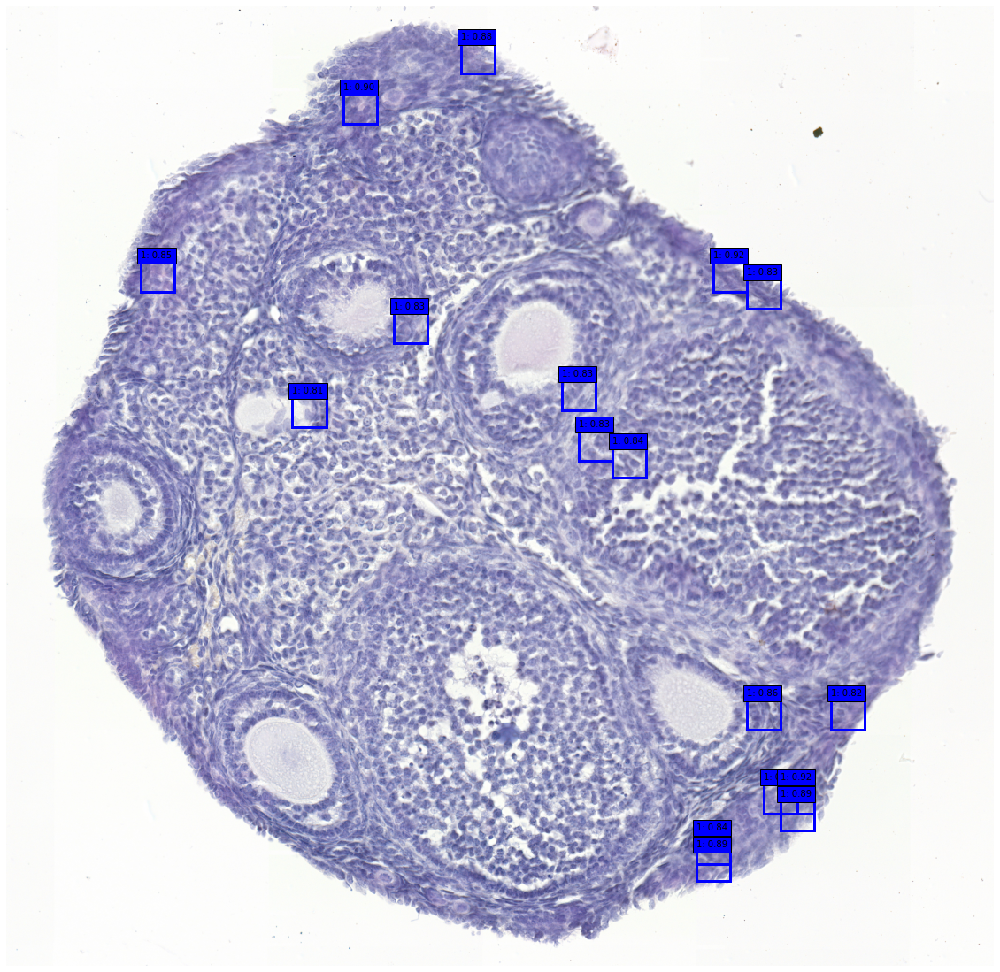

In [14]:
predicted_locations = predict_locations_for_gridsize(coupe, 200, model_loaded)
selected_locations = filter_predictions(predicted_locations, proba_threshold=0.8)
display_slice_and_predictions(coupe, selected_locations)


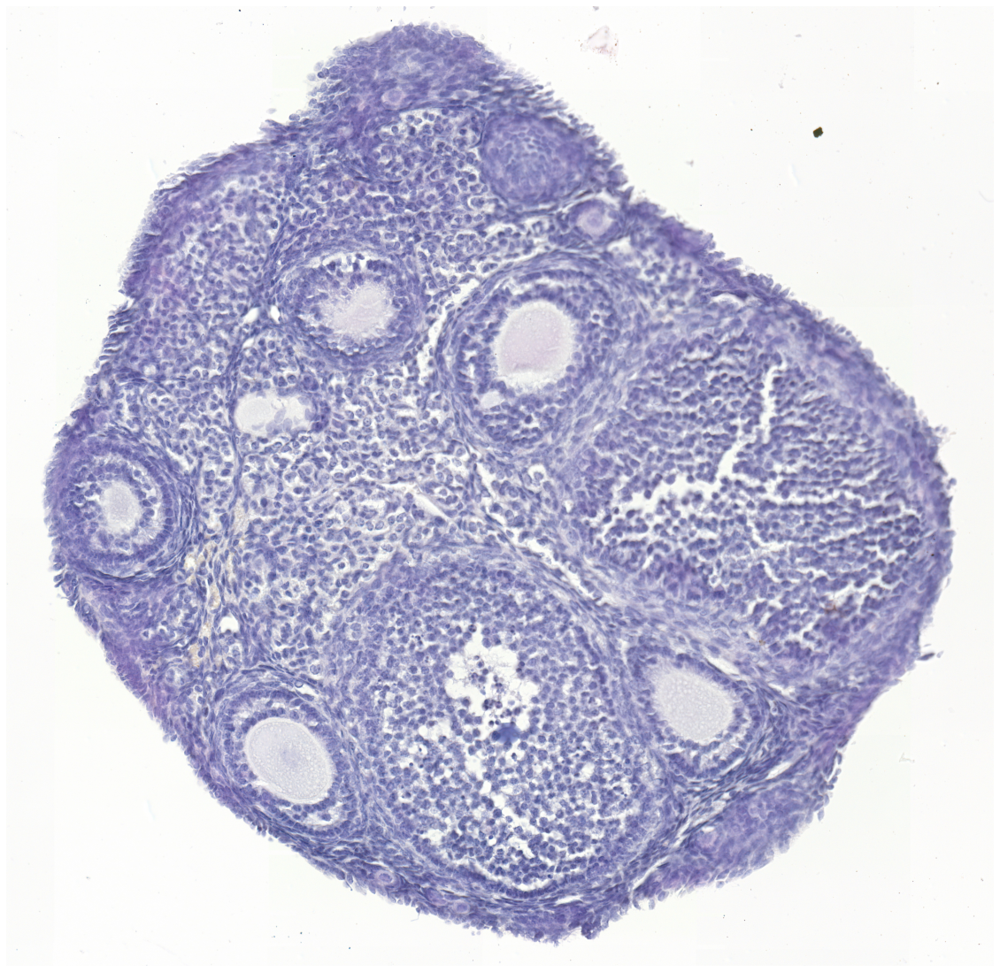

In [47]:
predicted_locations = predict_locations_for_gridsize(coupe, 400, model_loaded)
selected_locations = filter_predictions(predicted_locations, proba_threshold=0.8)
display_slice_and_predictions(coupe, selected_locations)


In [19]:
df = pd.read_csv('test_labels.csv')
df.loc[df["filename"] == "D-1M01-2.jpg"]

,filename,width,height,class,xmin,ymin,xmax,ymax
0,D-1M01-2.jpg,4389,4225,Negative,1665,2602,2745,3800
1,D-1M01-2.jpg,4389,4225,Negative,925,3203,1388,3773
2,D-1M01-2.jpg,4389,4225,Primordial,404,2191,541,2321
3,D-1M01-2.jpg,4389,4225,Primary,3024,2374,3625,2747
4,D-1M01-2.jpg,4389,4225,Negative,2760,2585,3609,3338
5,D-1M01-2.jpg,4389,4225,Secondary,724,2117,1475,2809
6,D-1M01-2.jpg,4389,4225,Secondary,1954,614,2982,1687
7,D-1M01-2.jpg,4389,4225,Secondary,1070,550,1777,1218
8,D-1M01-2.jpg,4389,4225,Negative,653,3150,829,3302


In [40]:
class_to_label = {
        "Negative": 0,
        "Primordial": 1, 
        "Primary": 2, 
        "Secondary": 3, 
        "Tertiary": 4, 
    }
    

In [41]:
locations = []
for index, row in df.iterrows():
    loc_dict = {}
    loc_dict["bbox"] = (row['xmin'], row['ymin'], row['xmax'], row['ymax'])
    loc_dict["label"] = class_to_label[row['class']]
    loc_dict["proba"] = 1
    locations.append(loc_dict)

locations

[{'bbox': (1665, 2602, 2745, 3800), 'label': 0, 'proba': 1},
 {'bbox': (925, 3203, 1388, 3773), 'label': 0, 'proba': 1},
 {'bbox': (404, 2191, 541, 2321), 'label': 1, 'proba': 1},
 {'bbox': (3024, 2374, 3625, 2747), 'label': 2, 'proba': 1},
 {'bbox': (2760, 2585, 3609, 3338), 'label': 0, 'proba': 1},
 {'bbox': (724, 2117, 1475, 2809), 'label': 3, 'proba': 1},
 {'bbox': (1954, 614, 2982, 1687), 'label': 3, 'proba': 1},
 {'bbox': (1070, 550, 1777, 1218), 'label': 3, 'proba': 1},
 {'bbox': (653, 3150, 829, 3302), 'label': 0, 'proba': 1}]

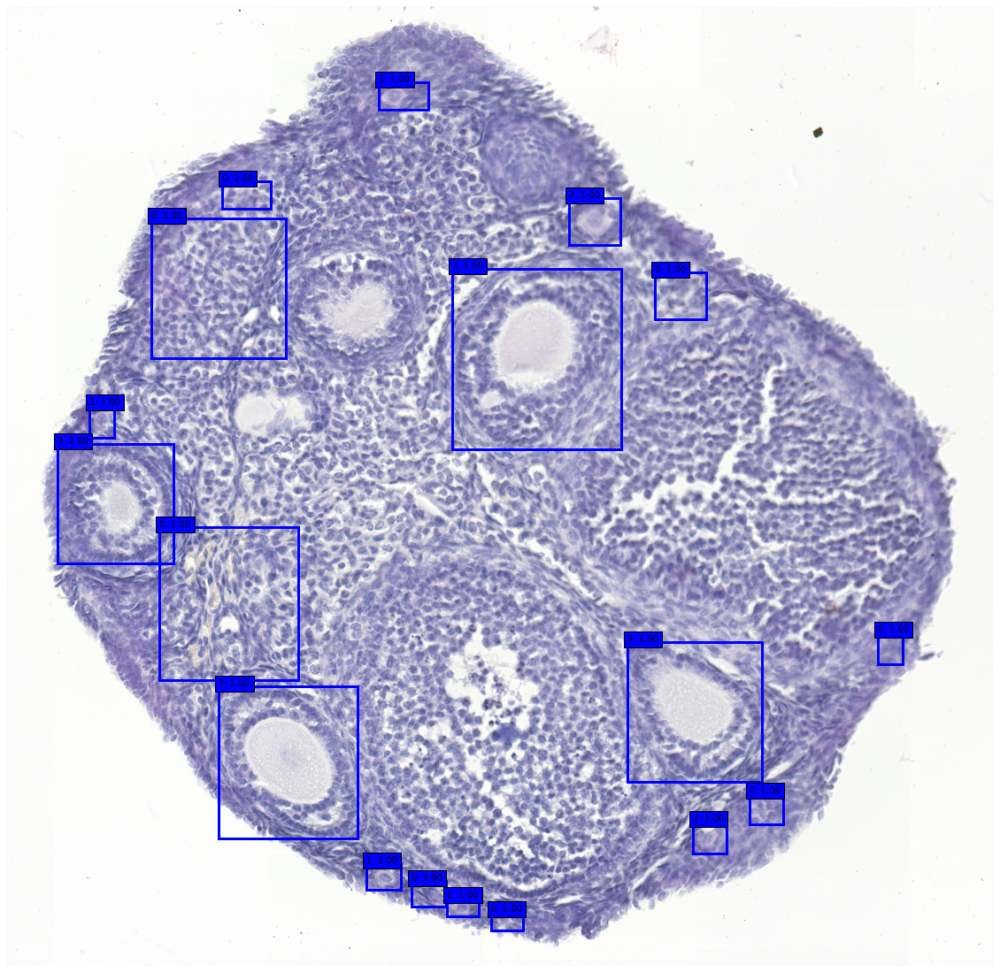

In [46]:
def load_coordinates(image_filename):
    df = pd.read_csv('data//scenario1/labels.csv')
    # filter only relevent image
    df = df.loc[df["filename"] == image_filename]
    locations = []
    for index, row in df.iterrows():
        loc_dict = {}
        loc_dict["bbox"] = (row['xmin'], row['ymin'], row['xmax'], row['ymax'])
        loc_dict["label"] = class_to_label[row['class']]
        loc_dict["proba"] = 1
        locations.append(loc_dict)
    # list of {bbox, label, proba}
    return locations


coupe = load_image("D-1M01-3.jpg")
true_box_locations = load_coordinates("D-1M01-3.jpg")
display_slice_and_predictions(coupe, true_box_locations)
